In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
pd.set_option('display.float_format', '{:.6f}'.format)

# Cargar Dataset
Además de cargar el dataset, agregamos la columna de 1's para tener la columna de constante

In [4]:
df = pd.read_csv('dat.csv', header=None)
df.insert(loc=0, column='ones', value=1) 
df.head()

,ones,0,1,2
0,1,0.931719,50.942832,2596.040230
1,1,0.796997,50.312938,2532.026902
2,1,1.115603,50.156194,2516.888332
3,1,1.064629,50.774814,2579.215190
4,1,1.796804,50.055668,2508.798424


### Hacemos un shuffle del dataset

In [5]:
newdf = df.sample(frac=1)
newdf

,ones,0,1,2
1692,1,23.280789,52.297440,3277.017320
52007,1,2.398298,98.907991,9788.542475
99886,1,72.253151,144.040123,25968.074993
68786,1,97.735294,115.035319,22785.312274
52367,1,92.237072,99.082858,18325.090303
...,...,...,...,...
87746,1,37.456644,133.038388,19102.212820
29826,1,57.550405,78.724308,9509.565873
100062,1,16.345202,144.098081,21031.422466
35708,1,27.539561,84.203971,7848.736127


### Convertimos el dataset en un numpy array para poder procesarlo

In [6]:
arr = np.array(newdf)
arr

array([[1.00000000e+00, 2.32807888e+01, 5.22974396e+01, 3.27701732e+03],
       [1.00000000e+00, 2.39829783e+00, 9.89079908e+01, 9.78854247e+03],
       [1.00000000e+00, 7.22531512e+01, 1.44040123e+02, 2.59680750e+04],
       ...,
       [1.00000000e+00, 1.63452021e+01, 1.44098081e+02, 2.10314225e+04],
       [1.00000000e+00, 2.75395608e+01, 8.42039709e+01, 7.84873613e+03],
       [1.00000000e+00, 1.35497806e+01, 1.57206140e+02, 2.48973670e+04]])

# Partir el Array
Partimos el array en un training, validating (CV), y testing set.

In [7]:
# Partir el dataset en training 75%, cross validation testing 15%, y testing 15%
train, validate, test = np.split(arr, [int(len(arr)*0.7), int(len(arr)*0.85)])

### Separamos las columnas "X" y "Y"

In [8]:
xtrain = train[:,0:3]
ytrain = train[:,3].reshape(len(xtrain),1)
xcv = validate[:,0:3]
ycv = validate[:,3].reshape(len(xcv),1)
xtest = test[:,0:3]
ytest = test[:,3].reshape(len(xtest),1)

# Funciones
Tenemos la función de costo, del gradiente lineal de costo y el gradiente final

In [9]:
def linear_function_cost(X, y, theta):
    h = X @ theta
    return ((y - h) ** 2).sum() / (2 * len(X))

def linear_gradient_cost(X, y, theta):
    h = X @ theta
    return (X.T @ (h - y)) / len(X)

def gradient_descent_cost(X, y, theta_0, linear_function, linear_gradient, learning_rate=0.0000001, threshold= 2, max_iter=1000):
    theta = theta_0
    iteration = 0
    costs = []
    thetas = []

    while np.linalg.norm(linear_gradient(X, y, theta)) > threshold and iteration < max_iter:
        iteration += 1
        theta = theta - learning_rate * linear_gradient(X, y, theta)
        costs.append(linear_function(X, y, theta))
        thetas.append(theta.copy())
    return theta, costs, thetas

Generamos un theta random para poder iniciar los procesos

In [11]:
m, n =  xtrain.shape
random_theta = np.random.rand(n,1)
random_theta

array([[0.16158552],
       [0.94830764],
       [0.71522375]])

# Polinomio 1

In [12]:
theta_results1, costs1, thetas1 = gradient_descent_cost(xtrain, ytrain, random_theta, linear_function_cost, linear_gradient_cost)
theta_results1

array([[  0.98710986],
       [ 48.4469627 ],
       [134.89036255]])

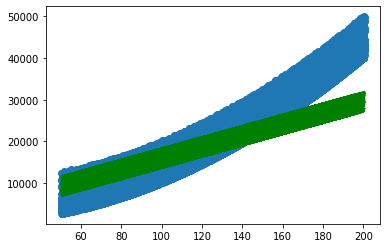

In [13]:
plt.scatter(xcv[:, 2], ycv)
plt.plot(xcv[:, 2], xcv @ theta_results1, color='green')
plt.show()

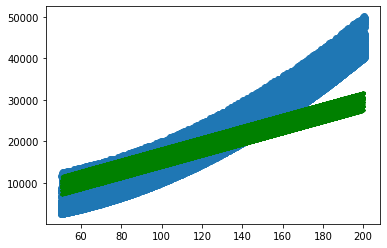

In [14]:
plt.scatter(xtest[:, 2], ytest)
plt.plot(xtest[:, 2], xtest @ theta_results1, color='green')
plt.show()

## Conclusión Polinomio 1
Vemos que no se ajusta de la manera más óptima pero es un buen inicio

# Polinomio 2
Ahora vamos a agregar otra columna, donde simplemente será el valor al cuadrado de la primera (no la de constantes).

In [76]:
pol2 = (xtrain[:,1]**2).reshape(len(xtrain),1)
xtrain2 = np.append(xtrain, pol2, axis=1)
pol2 = (xcv[:,1]**2).reshape(len(xcv),1)
xcv2 = np.append(xcv, pol2, axis=1)
pol2 = (xtest[:,1]**2).reshape(len(xtest),1)
xtest2 = np.append(xtest, pol2, axis=1)

Modificamos el shape de thetas para tomar en cuenta la nueva columna

In [77]:
random_theta = np.random.rand(n+1,1)
random_theta

array([[0.38496213],
       [0.93696089],
       [0.23062037],
       [0.40940927]])

Le modificamos el learning rate a un número más pequeño, para que la función logre converger.

In [78]:
theta_results2, costs2, thetas2 = gradient_descent_cost(xtrain2, ytrain, random_theta, linear_function_cost, linear_gradient_cost, learning_rate=0.000000001)
theta_results2

array([[0.39323719],
       [1.12636463],
       [1.7400596 ],
       [3.85066192]])

# Analizar función de costo

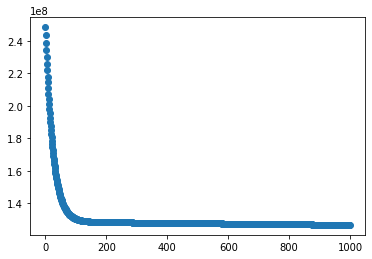

In [79]:
xrow = np.arange(0,1000,1).reshape(-1,1)
plt.scatter(xrow, costs2)
plt.show()

Podemos observar que nuestra función de costos paso de estar plana a volver a incrementar. Esto nos dice que el polinomio que estamos tratando de introducir al modelo simplemente nos incrementa el error. Por lo tanto 

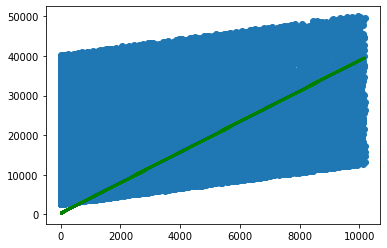

In [64]:
plt.scatter(xcv2[:, 3], ycv)
plt.plot(xcv2[:, 3], xcv2 @ theta_results2, color='green')
plt.show()

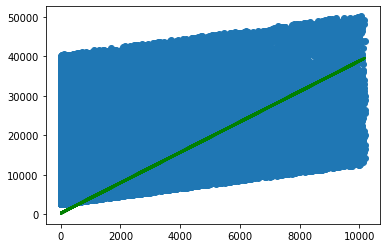

In [65]:
plt.scatter(xtest2[:, 3], ytest)
plt.plot(xtest2[:, 3], xtest2 @ theta_results2, color='green')
plt.show()

# Polinomio 3

In [96]:
random_theta = np.random.rand(n+2,1)

In [82]:
pol3 = (xtrain[:,1]**3).reshape(len(xtrain),1)
xtrain3 = np.append(xtrain2, pol3, axis=1)
pol3 = (xcv[:,1]**3).reshape(len(xcv),1)
xcv3 = np.append(xcv2, pol3, axis=1)
pol3 = (xtest[:,1]**3).reshape(len(xtest),1)
xtest3 = np.append(xtest2, pol3, axis=1)

In [83]:
theta_results3, costs3, thetas3 = gradient_descent_cost(xtrain3, ytrain, random_theta, linear_function_cost, linear_gradient_cost, learning_rate=0.00000000000001, threshold=4, max_iter=3000)
theta_results3

array([[0.18974874],
       [0.69216855],
       [0.11799255],
       [0.68258123],
       [0.03365052]])

Podemos ver desde el polinomio de grado 4 que los coeficientes ya se están volviendo más chiquitos. Por lo tanto, es apropiado decir que el grado de polinomio 3 es el que mejor se ajusta para este modelo en específico

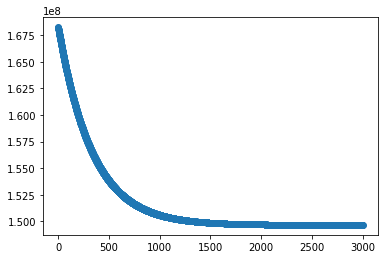

In [84]:
xrow = np.arange(0,3000,1).reshape(-1,1)
plt.scatter(xrow, costs3)
plt.show()

# Conclusiones
Vemos que agregar más polinomios al modelo no lo mejora, por lo que la regresión lineal inicial o la de grado 2 son las más apropiadas para describir el modelo. Pudimos observar como el último coeficiente de theta en la regresión polinomial de grado 3 era un número casi insignificativo. Como vimos en clase, cuando se observa que los coeficientes se vuelven más pequeños es que indica que el modelo probablemente ya no sea necesario de analizarlo en un polinomio más alto. En el modelo de polinomio 3 tuvimos que reducir bastante el parámetro de learning rate para que la función lograra converger. 